## imports / setup

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd

from pathlib import Path
import torch
from torch import optim, nn
import PIL 
import pydicom
from functools import partial

In [3]:
import mask_functions

# helpers

In [4]:
def ls(p, re='*'):
    return [i for i in p.glob(re)]

In [46]:
def getImg(fpath):
    ds = pydicom.read_file( fpath) # read dicom image
    return ds.pixel_array, ds # get image array
    
def getMask(imgId, df, shape):
    """returns nd array mask"""
    df = df.loc[df['ImageId'] == imgId]
    rle = '0'
    try: 
        rle = df['EncodedPixels'].tolist()[0].strip()
    except:
        rle = '-1'

    mask = np.zeros([*shape])
    if not rle == '-1':
        mask = mask_functions.rle2mask(rle, *shape)
        mask = np.flip(mask, axis=0)
        mask = np.rot90(mask, -1)
    return mask

def getImageAndMask(fname, labels):
    imgf = fname 
    imgPath = str(imgf)
    imgId = imgf.stem
    img,_ = getImg( imgPath )
    mask = getMask(imgId, df=labels, shape=img.shape)
    return img, mask

In [47]:
def plot_multi(fn, size=[1,1], item_list=[]):
    fig, ax = plt.subplots(size[0],size[1], figsize=(40,60))
    for i, row_ax in enumerate(ax):
        for j, a in enumerate(row_ax):
            idx = size[1]*i+j
            if not idx > (len(item_list)-1):
                item = item_list[idx]
                fn(a, item)
                 
def plot_xray_mask(a, item, df, show_mask=True):
    img, mask = getImageAndMask(item, labels=df)
    a.imshow(img, cmap=plt.cm.bone)
    # if mask
    if not np.all(mask == 0): 
        a.set_title('Pneumothorax Present')
        a.imshow(mask, alpha=0.3, cmap='Reds')

# Check out sample

In [28]:
!ls

Dockerfile   dataloader_full.ipynb  pneumothorax.ipynb	 sample_net.ipynb
Readme.md    download_images.py     requirements.in	 sample_submission.csv
__pycache__  makefile		    requirements.txt	 unet_basic.ipynb
data	     mask_functions.py	    sample%20images.zip


In [29]:
# get sample data
pwd = !pwd
path = Path(pwd[0])

In [30]:
dataPath = path/'data'
labels = dataPath/'train-rle-sample.csv'

In [31]:
fnames = ls(dataPath, '*.dcm'); fnames

[PosixPath('/home/ubuntu/code/siim-acr-pub/data/1.2.276.0.7230010.3.1.4.8323329.12743.1517875241.599591.dcm'),
 PosixPath('/home/ubuntu/code/siim-acr-pub/data/1.2.276.0.7230010.3.1.4.8323329.4982.1517875185.837576.dcm'),
 PosixPath('/home/ubuntu/code/siim-acr-pub/data/1.2.276.0.7230010.3.1.4.8323329.4440.1517875182.865105.dcm'),
 PosixPath('/home/ubuntu/code/siim-acr-pub/data/1.2.276.0.7230010.3.1.4.8323329.1000.1517875165.878027.dcm'),
 PosixPath('/home/ubuntu/code/siim-acr-pub/data/1.2.276.0.7230010.3.1.4.8323329.10003.1517875220.942420.dcm'),
 PosixPath('/home/ubuntu/code/siim-acr-pub/data/1.2.276.0.7230010.3.1.4.8323329.1314.1517875167.222290.dcm'),
 PosixPath('/home/ubuntu/code/siim-acr-pub/data/1.2.276.0.7230010.3.1.4.8323329.10000.1517875220.938530.dcm'),
 PosixPath('/home/ubuntu/code/siim-acr-pub/data/1.2.276.0.7230010.3.1.4.8323329.4904.1517875185.355709.dcm'),
 PosixPath('/home/ubuntu/code/siim-acr-pub/data/1.2.276.0.7230010.3.1.4.8323329.10002.1517875220.939397.dcm'),
 Posix

In [11]:
labelsdf = pd.read_csv(labels, names=['ImageId', 'EncodedPixels']); labelsdf.head()

,ImageId,EncodedPixels
0,1.2.276.0.7230010.3.1.4.8323329.1000.151787516...,-1
1,1.2.276.0.7230010.3.1.4.8323329.10000.15178752...,-1
2,1.2.276.0.7230010.3.1.4.8323329.10001.15178752...,-1
3,1.2.276.0.7230010.3.1.4.8323329.10002.15178752...,-1
4,1.2.276.0.7230010.3.1.4.8323329.10003.15178752...,-1


In [12]:
mask = getMask(fnames[1].stem, labelsdf, [1024, 1024])

np.all(mask == 0)

False

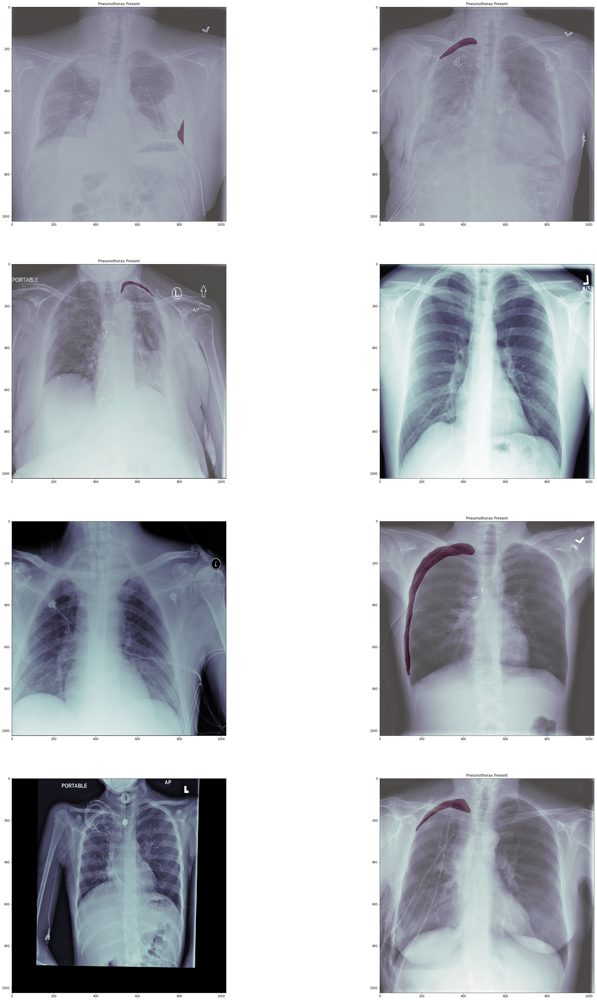

In [13]:
plot_samples = partial(plot_xray_mask, df=labelsdf, show_mask=True)
plot_multi(plot_samples, [4,2], item_list=fnames)

# Full data set

In [16]:
dataPath = Path('/home/ubuntu/data/fastai/data')
path = dataPath/'siim-acr'

In [17]:
ls(path)

[PosixPath('/home/ubuntu/data/fastai/data/siim-acr/dicom-images-test'),
 PosixPath('/home/ubuntu/data/fastai/data/siim-acr/dicom-images-train'),
 PosixPath('/home/ubuntu/data/fastai/data/siim-acr/sample_submission.csv'),
 PosixPath('/home/ubuntu/data/fastai/data/siim-acr/download_images.py'),
 PosixPath('/home/ubuntu/data/fastai/data/siim-acr/train-rle.csv'),
 PosixPath('/home/ubuntu/data/fastai/data/siim-acr/mask_functions.py'),
 PosixPath('/home/ubuntu/data/fastai/data/siim-acr/sample%20images.zip'),
 PosixPath('/home/ubuntu/data/fastai/data/siim-acr/__pycache__'),
 PosixPath('/home/ubuntu/data/fastai/data/siim-acr/siim-acr-pneumothorax-segmentation-data.zip')]

In [18]:
testpath = path/'dicom-images-test'
trainpath = path/'dicom-images-train'
trainlabels = path/'train-rle.csv'

## Mask Labels

In [19]:
df_rle_labels = pd.read_csv(trainlabels); 
df_rle_labels.columns = ['ImageId', 'EncodedPixels']
df_rle_labels.head()

,ImageId,EncodedPixels
0,1.2.276.0.7230010.3.1.4.8323329.5597.151787518...,-1
1,1.2.276.0.7230010.3.1.4.8323329.12515.15178752...,-1
2,1.2.276.0.7230010.3.1.4.8323329.4904.151787518...,175349 7 1013 12 1009 17 1005 19 1003 20 1002...
3,1.2.276.0.7230010.3.1.4.8323329.32579.15178751...,407576 2 1021 7 1015 10 1013 12 1011 14 1008 ...
4,1.2.276.0.7230010.3.1.4.8323329.32579.15178751...,252069 1 1021 3 1020 4 1018 5 1018 6 1016 7 1...


## Image files

In [20]:
ls(trainpath)[0]

PosixPath('/home/ubuntu/data/fastai/data/siim-acr/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.32647.1517875161.607620')

In [21]:
ls(ls(ls(trainpath)[0])[0])[0]

PosixPath('/home/ubuntu/data/fastai/data/siim-acr/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.32647.1517875161.607620/1.2.276.0.7230010.3.1.3.8323329.32647.1517875161.607619/1.2.276.0.7230010.3.1.4.8323329.32647.1517875161.607621.dcm')

In [22]:
img_list = []

for i in ls(trainpath):
    for fld in ls(i):
        for img in ls(fld):
            img_list.append(img)

In [23]:
trn_fnames = img_list

1.2.276.0.7230010.3.1.4.8323329.32647.1517875161.607621 636039 2 1020 9 1013 12 1010 15 1007 18 1004 21 1001 23 1000 24 1000 25 998 26 998 26 997 27 996 28 996 28 995 30 993 31 992 33 990 34 990 34 989 35 989 34 989 34 990 33 991 31 992 31 993 30 994 29 994 28 996 27 997 26 998 25 999 25 999 24 1000 23 1001 22 1002 22 1002 21 1003 20 1004 20 1004 20 1004 20 1004 20 1004 19 1005 19 1005 19 1005 19 1005 19 1005 19 1005 19 1005 19 1005 19 1005 19 1006 18 1006 18 1006 18 1006 18 1006 18 1006 18 1006 18 1006 18 1006 18 1006 19 1005 19 1005 19 1006 19 1005 19 1005 19 1005 20 1004 20 1004 20 1005 19 1005 19 1005 20 1004 20 1004 20 1004 20 1005 19 1005 20 1004 20 1004 21 1003 21 1003 21 1004 20 1005 20 1004 20 1005 19 1005 19 1006 18 1007 18 1007 18 1007 17 1007 18 1007 17 1007 17 1008 16 1008 16 1008 16 1009 15 1009 15 1010 14 1010 14 1010 14 1011 14 1011 13 1011 14 1011 13 1011 13 1012 13 1012 12 1012 12 1013 11 1013 11 1014 10 1015 10 1015 9 1015 9 1016 8 1017 7 1018 6 1019 5 1020 5 1020 4 

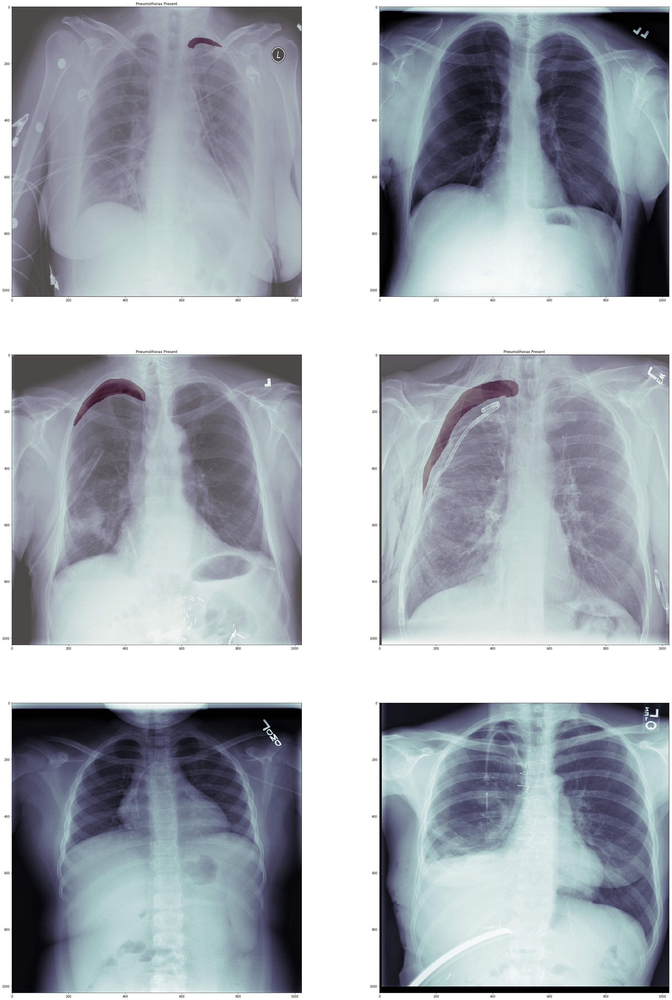

In [33]:
plot_trn = partial(plot_xray_mask, df=df_rle_labels, show_mask=True)
plot_multi(plot_trn, [3,2], item_list=trn_fnames[0:10])

In [36]:
from torch.utils.data import Dataset, dataloader

In [37]:
dev = torch.device(
    "cuda") if torch.cuda.is_available() else torch.device("cpu")

In [51]:
np.array(((1, 2), (1,2) ) ).shape

(2, 2)

In [52]:
class Xray(Dataset):
    def __init__(self):
        
        x,y = zip(*[
            getImageAndMask(p, df_rle_labels) for p in trn_fnames
        ])
        tmpx = np.array(x)
        m, h, w = tmpx.shape
        self.x = torch.Tensor(x).view(m, 1, h, w).to(dev)
        self.y = torch.Tensor(y).view(m, 1, h, w).to(dev)
        self.len = len(x)
        
    def __getitem__(self, index):
        return self.x[index], self.y[index]
        
    def __len__(self):
        return self.len

In [ ]:
ds = Xray()

In [40]:
dl = dataloader.DataLoader(ds, batch_size=1, shuffle=True)

NameError: name 'ds' is not defined